<a href="https://colab.research.google.com/github/Laurent-I/Kaggle-Beginner/blob/main/tech_tours/Big_Four_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 # End to end Multi-class Animal Classification
 
 This notebook builds an end-to-end multi-class image classifier using TensorFlow Hub.

 ## 1. Problem

 Identifying the big four (Lion, Cheetah, Elephant, Rhinoceros)

 ## 2. Data

 The data is from multiple Datasets that have been compiled together

 ## 3. Evaluation

 The evaluation is a file with the prediction probabilites for each dog breed of each test image.

## 4. Features

Some information about the data:
* We are dealing with images so it is probably best we use deep learning or transfer learning.
* There are 4 types of animals. ( This means there are 4 different classes) .
* There are over 500 images in each directory which makes those over 2000 images.
* So we have over 1600 training images and 400 images for testing and validation 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Get the workspace ready
* Import necessary tools 
* Make sure we are using a GPU 



In [1]:
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
from IPython.display import Image
import numpy as np
print("Tf Version:", tf.__version__)
print("Tf Hub Version:", hub.__version__)

# Check for GPU Availability
print("GPU", "available (YESS!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

Tf Version: 2.9.2
Tf Hub Version: 0.12.0
GPU available (YESS!!!)


## Getting the Data Ready
Converting the data to tensors for our model to understand.

In [2]:
labels_csv = pd.read_csv("/content/drive/MyDrive/data/image_labels.csv")
print(labels_csv.describe())
labels_csv.head()

                id
count  1840.000000
mean   1151.455978
std     664.816335
min       3.000000
25%     574.750000
50%    1147.500000
75%    1724.250000
max    2298.000000


,id,label
0,1000,elephant
1,1001,elephant
2,1002,elephant
3,1003,elephant
4,1004,elephant


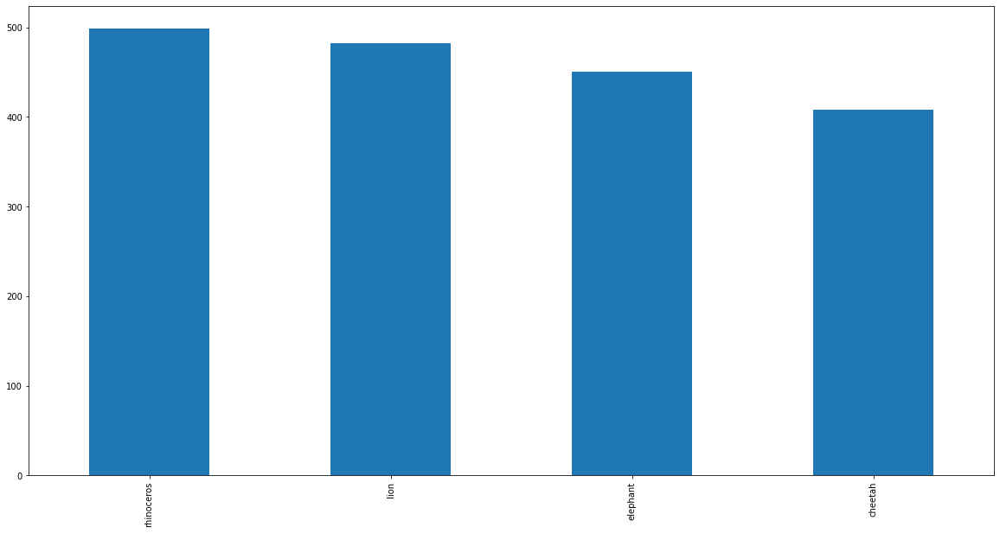

In [3]:
# Check how many animals we have per animal type
labels_csv["label"].value_counts().plot.bar(figsize = (20, 10));

We can see that the rhinoceros has the highest number but by a small margin. We can see that our data is somehow ok because there is no big difference between the the total animals available

In [9]:
labels_csv["label"].value_counts().median()

466.5

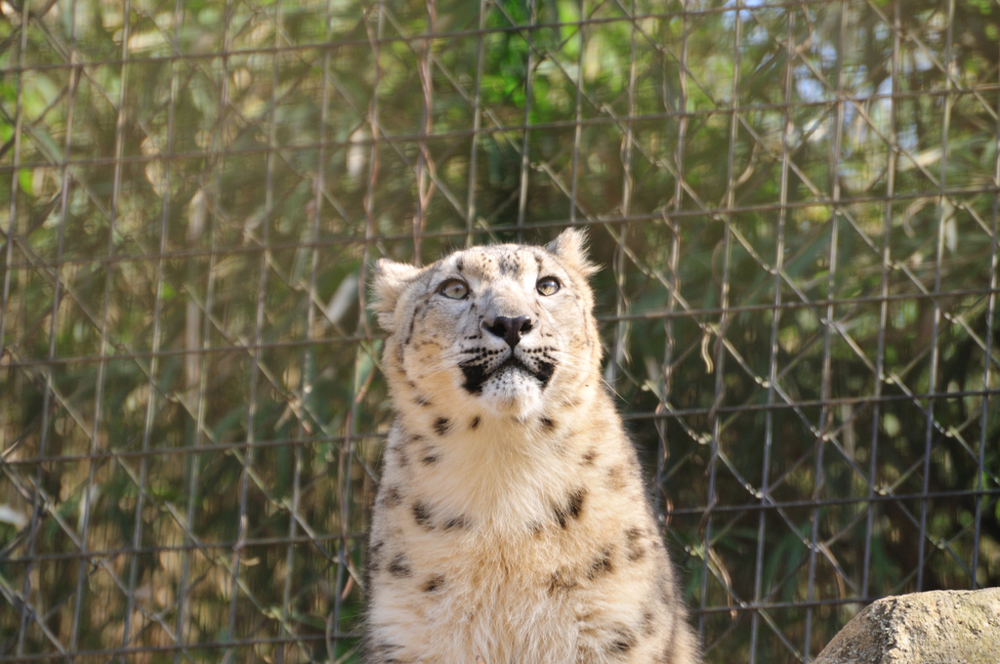

In [11]:
# taking a look at a sample image
Image("drive/MyDrive/data/train/10.png")

## Getting images and their labels
* Get a list of all image file pathnames from their Id
* Prepare labels and see if our labels match number of filenames
* Identify unique label values and turn every label into an array of booleans

In [4]:
# convert images to a numpy list
labels = labels_csv["label"].to_numpy()
# create pathnames from the Image Id
# Remember to convert the extract name to a string if the id is a number in order to concatenate it to the directory
filenames = ["drive/MyDrive/data/train/" + str(fname) + ".png" for fname in labels_csv["id"]]
# Check whether number of filenames matches number of actual image file
import os
if len(os.listdir("drive/MyDrive/data/train/")) == len(filenames):
  print("Filenames match the actual amount of files!! Proceed!!")
else:
  print("Check the target directory.")

# Check whether the number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames")
else:
  print("Number of labels does not match number of filenames, check the data directories!")

# Find the unique labels and turn every label into a boolean based on the unique values
unique = np.unique(labels)
boolean_labels = [label == unique for label in labels]
len(boolean_labels)

Filenames match the actual amount of files!! Proceed!!
Number of labels matches the number of filenames


1840

## Importing the validation and setting up the X and y values 




In [5]:
# Create a random seed for consistency
np.random.seed(42)
val_labels_csv = pd.read_csv("/content/drive/MyDrive/data/valid_labels.csv")
# convert images to a numpy list
val_labels = val_labels_csv["label"].to_numpy()
# create pathnames from the Image Id
# Remember to convert the extract name to a string if the id is a number in order to concatenate it to the directory
val_filenames = ["drive/MyDrive/data/valid/" + str(fname) + ".png" for fname in val_labels_csv["id"]]
# Check whether number of filenames matches number of actual image file
import os
if len(os.listdir("drive/MyDrive/data/valid/")) == len(val_filenames):
  print("Filenames match the actual amount of files!! Proceed!!")
else:
  print("Check the target directory.")

# Check whether the number of labels matches the number of filenames
if len(val_labels) == len(val_filenames):
  print("Number of labels matches the number of filenames")
else:
  print("Number of labels does not match number of filenames, check the data directories!")

# Find the unique labels and turn every label into a boolean based on the unique values
val_unique = np.unique(val_labels)
val_boolean_labels = [label == val_unique for label in val_labels]
len(val_boolean_labels)

X_train = filenames[:1000]
y_train = boolean_labels[:1000]
X_val = val_filenames
y_val = val_boolean_labels
len(val_labels), len(val_filenames), len(val_boolean_labels)

Filenames match the actual amount of files!! Proceed!!
Number of labels matches the number of filenames


(229, 229, 229)

## Preprocessing our images
I am going to turn my images into tensors using a function which:
* Takes an image filepath as input
* Uses TensorFlow to read the file and save it to a variable
* Turn our image into Tensors
* Normalize our images by converting the color channel values from 0-255 to 0-1.
* Resize the image to a shape of (224,224)
* Return the modified image

In [6]:
IMG_SIZE = 224

# A preprocessing function for images
def preprocessing(image_path):
  """
  Take an image file path and turn the image into a Tensor
  """
  # Read the image for the pathname
  image = tf.io.read_file(image_path)
  
  # Turn the image to a tensor with 3 color channels
  image = tf.image.decode_png(image, channels = 3)

  # Convert the color channels values to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image 
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  # Add an extra dimension
  # image = tf.expand_dims(image, axis=0)

  return image

In [7]:
# Data augementation function use imgaug library
def augment_data(image):
    # Randomly flip the image horizontally
    image = tf.image.random_flip_left_right(image)

    # Randomly adjust brightness
    image = tf.image.random_brightness(image, max_delta=0.2)

    # Randomly adjust saturation
    image = tf.image.random_saturation(image, lower=0.5, upper=1.5)

    # Randomly adjust hue
    image = tf.image.random_hue(image, max_delta=0.2)

    # Randomly adjust contrast
    image = tf.image.random_contrast(image, lower=0.5, upper=1.5)

    return image

## Turning our data to batches
We are using a 32 batch size
Plus we need our images in form of Tensor tuples (images, label)

In [8]:
# A function for returning a tuple
def get_image_label(image_path, label):
  
  image = preprocessing(image_path)
  image = augment_data(image)
  return image, label

In [9]:
# A function for turining data into batches
BATCH_SIZE = 32
def create_data_batches(X, y = None, batch_size =BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels). 
  """
  # if we have a test dataset
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(preprocessing).batch(BATCH_SIZE)
    return data_batch

  # If we have validation data
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffle the filenames and labels before mapping image processing function to increase speed
    data = data.shuffle(buffer_size = len(X))
    data = data.map(get_image_label)
    data_batch  = data.batch(BATCH_SIZE)
  
  return data_batch

In [10]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data= True)

Creating training data batches...
Creating validation data batches...


In [11]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure 
  plt.figure(figsize= (10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [12]:
# Turn the dataset to a numpy array and use the next() function to get the next batch in the dataset
train_images , train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

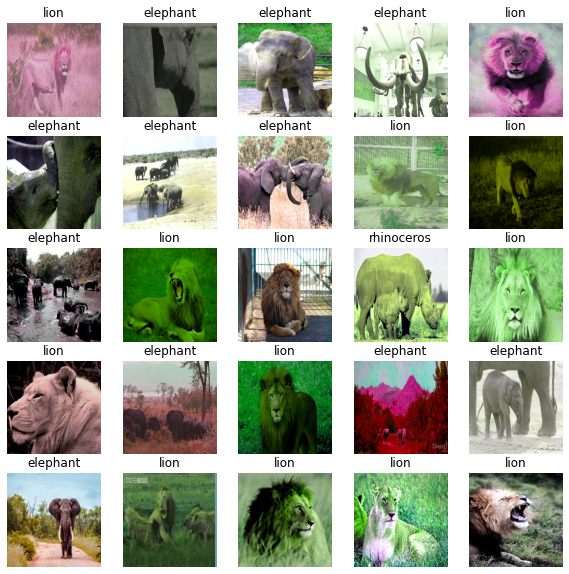

In [13]:
show_25_images(train_images, train_labels)

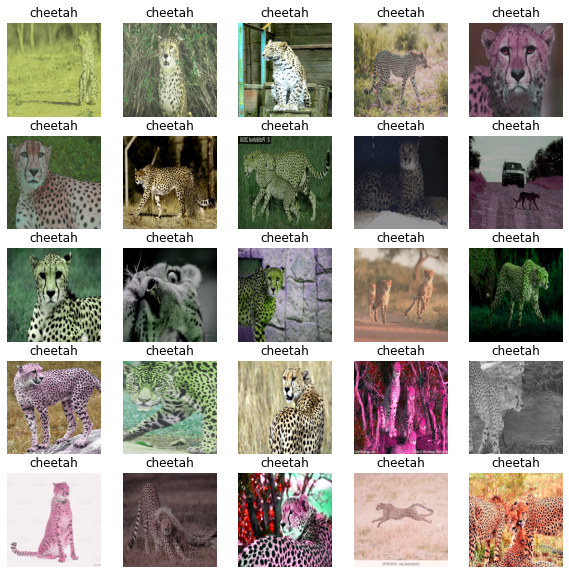

In [14]:
# Now let's visualize our validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub


In [15]:
# Input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Output Shape
OUTPUT_SHAPE = len(unique)

# Pre-trained model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

# A function which builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [16]:
model =create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 4)                 4008      
                                                                 
Total params: 5,436,721
Trainable params: 4,008
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
I am going to create two callbacks which will help to track my model's progress and another for early stopping to prevent overfitting and our model running for long.

* TensorBoard Callback and
* EarlyStopping Callback

In [17]:
# load tensorboard notebook extension
%load_ext tensorboard

In [18]:
import datetime

# A Function to build a tensorboard callback 
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard logs
  logdir = os.path.join("drive/MyDrive/data/logs",
                        # make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [19]:
# Early Stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 4)

In [20]:
NUM_EPOCHS = 100 #@param {type: "slider" ,min:10, max:100, step:10 }

## Training the model 
We are using most of the previous function:
* `create_model()`
* `create_tensorboard_callback()`
* `fit()` to pass the training, validation data, number of epochs to train for and the callbacks we are using
* Return the model

In [21]:
from sklearn.utils import validation
# A function to train and return a trained model
def train_model():
  """
  Train a given model and return the trained version
  """
  # Create a model #
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [23]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
32/32 [==============================] - 767s 24s/step - loss: 0.5484 - accuracy: 0.8070 - val_loss: 1.4277 - val_accuracy: 0.5895
Epoch 2/100
32/32 [==============================] - 17s 526ms/step - loss: 0.1030 - accuracy: 0.9590 - val_loss: 1.1205 - val_accuracy: 0.7467
Epoch 3/100
32/32 [==============================] - 14s 450ms/step - loss: 0.0743 - accuracy: 0.9750 - val_loss: 1.2075 - val_accuracy: 0.7511
Epoch 4/100
32/32 [==============================] - 17s 531ms/step - loss: 0.0525 - accuracy: 0.9850 - val_loss: 1.2349 - val_accuracy: 0.7249
Epoch 5/100
32/32 [==============================] - 15s 473ms/step - loss: 0.0459 - accuracy: 0.9800 - val_loss: 1.2554 - val_accuracy: 0.7467
Epoch 6/100
32/32 [==============================] - 17s 525ms/step - loss: 0.0452 - accuracy: 0.9850 - val_loss: 1.2396 - val_accuracy: 0.7293
Epoch 7/100
32/32 [========================

In [24]:
 # Check the TensorBoard logs using the magic methods %tensorboard 
 %tensorboard --logdir drive/MyDrive/data/logs

<IPython.core.display.Javascript object>

In [25]:
 # Making predictions on the validation data (not used to train)
 predictions = model.predict(val_data, verbose = 1)
 predictions
 

8/8 [==============================] - 3s 354ms/step


array([[3.08625895e-05, 4.56985108e-05, 9.99869823e-01, 5.36550033e-05],
       [3.96028487e-03, 1.80483796e-02, 9.51885700e-01, 2.61056814e-02],
       [1.03987776e-01, 1.31069124e-01, 3.07761401e-01, 4.57181722e-01],
       [1.01612136e-02, 7.98697099e-02, 8.67196023e-01, 4.27730717e-02],
       [1.89370802e-03, 2.25173980e-02, 9.65856969e-01, 9.73194558e-03],
       [4.27914783e-03, 6.67672902e-02, 9.17411387e-01, 1.15421796e-02],
       [4.49316427e-02, 8.03660452e-02, 6.80201352e-01, 1.94501013e-01],
       [1.83016229e-02, 1.52014598e-01, 7.72516310e-01, 5.71674332e-02],
       [1.06259082e-02, 1.14623591e-01, 8.28233421e-01, 4.65170965e-02],
       [7.08177104e-05, 1.29691839e-01, 8.69675875e-01, 5.61536697e-04],
       [4.27508121e-03, 2.02316344e-02, 9.52141881e-01, 2.33513936e-02],
       [1.91727339e-03, 2.86893070e-01, 4.61299211e-01, 2.49890462e-01],
       [1.59086916e-03, 2.65225410e-01, 7.20185757e-01, 1.29979439e-02],
       [1.54012023e-03, 2.06370726e-01, 7.91324377e

In [26]:
# Checking the predictions made
index = 7
print(predictions[index])
print(f"Mav Value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique[np.argmax(predictions[index])]}")

[0.01830162 0.1520146  0.7725163  0.05716743]
Mav Value (probability of prediction): 0.7725163102149963
Sum: 0.9999999403953552
Max index: 2
Predicted label: lion


In [27]:
# Turn prediction probability into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probablities into a label.
  """
  return unique[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'lion'

In [96]:
val_data


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 4), dtype=tf.bool, name=None))>

I am going to unbatch the validation dataset in order to make predictions on the validation images then compare those predictions to the validation labels 

In [28]:
# A function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batch dataset of (Image, label) Tensors and returns separate arrays of images and labels
  """
  images = []
  labels = []

  # Loop through the unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique[np.argmax(label)])
  return images, labels

  # Unbatchify the validation data
val_images, val_labels  = unbatchify(val_data)
  # Glance at the data
val_images[0], val_labels[0]

(array([[[0.25629565, 0.09159656, 0.03842697],
         [0.25885436, 0.09415527, 0.04098567],
         [0.26141307, 0.09671397, 0.04354437],
         ...,
         [0.11812553, 0.03330198, 0.00957188],
         [0.11556682, 0.03074327, 0.00701317],
         [0.15394741, 0.06090637, 0.03534546]],
 
        [[0.26653048, 0.09812739, 0.04599556],
         [0.26653048, 0.10183138, 0.04866178],
         [0.26908922, 0.10439007, 0.05122049],
         ...,
         [0.1590648 , 0.0631088 , 0.03534546],
         [0.13347775, 0.04865422, 0.02492411],
         [0.1513887 , 0.06040451, 0.03534546]],
 
        [[0.28188273, 0.10710941, 0.05868157],
         [0.27932405, 0.10825469, 0.05878909],
         [0.28700015, 0.11222683, 0.06379899],
         ...,
         [0.18209317, 0.06735729, 0.03534546],
         [0.16674094, 0.06303341, 0.03534546],
         [0.18209317, 0.06442976, 0.03534546]],
 
        ...,
 
        [[0.51984245, 0.19911242, 0.13400176],
         [0.49937278, 0.18397522, 0.11353

In [29]:
get_pred_label(val_labels[0])

'cheetah'

## Going Visual with the predictions
We are going to create a function which:
* Takes an array of prediction_probabilities, array of truth labels and array of images and an integer
* Convert the predicted probabilities to a predicted label.
* Plot the predicted label, its probability,truth label and the target image on a single plot



In [30]:
def plot_pred(prediction_probabilities, labels, images, n =1):
  """
  View the prediction, ground_truth and the image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change the plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                    true_label), color = color)

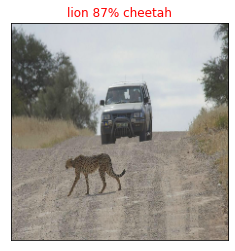

In [31]:
plot_pred(prediction_probabilities = predictions, labels = val_labels,
          images = val_images, n = 9)

In [32]:
 # Lets plot all the predictions made we are coloring the true label green
 def plot_pred_conf(prediction_probabilities, labels, n =1):
  """
  Plus all prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find all predictions confidences indexes
  all_pred_indexes  = pred_prob.argsort()[-10:][::-1]

  # Find all prediction confidence values
  all_pred_values = pred_prob[all_pred_indexes]

  # Find all prediction labels
  all_pred_labels = unique[all_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(all_pred_labels)),
                     all_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(all_pred_labels)),
             labels = all_pred_labels,
             rotation = "vertical")
  
  # Change the color of the true label
  if np.isin(true_label, all_pred_labels):
    top_plot[np.argmax(all_pred_labels == true_label)].set_color("green")
  else:
    pass

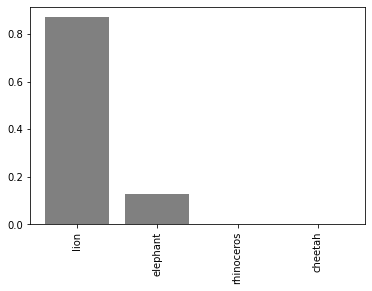

In [33]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n =9)

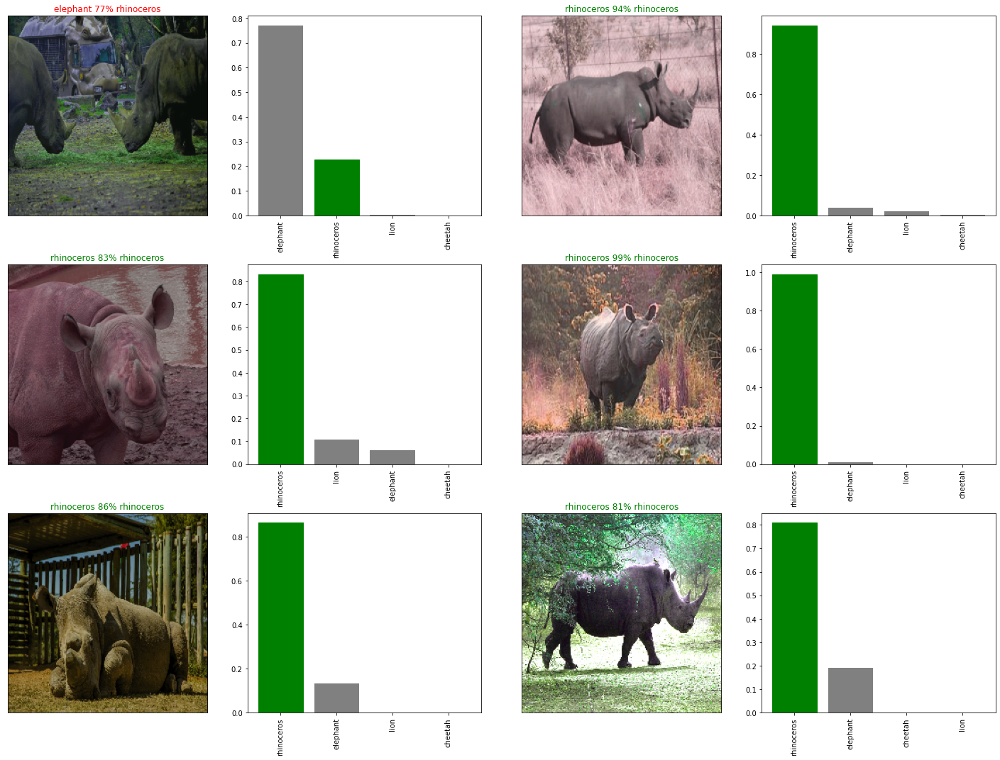

In [34]:
# Let's check out a few predictions and their difference values with images
i_multiplier = 160
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5* num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 *i + 1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images= val_images,
            n = i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions, 
                 labels = val_labels,
                 n = i + i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and Loading a trained model

In [35]:
# Creata a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (String)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [36]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading a saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  
  return model

In [124]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/data/models/20230204-11001675508431-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/data/models/20230204-11001675508431-1000-images-mobilenetv2-Adam.h5'

In [126]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/data/models/20230204-11001675508431-1000-images-mobilenetv2-Adam.h5")

Loading a saved model from: /content/drive/MyDrive/data/models/20230204-11001675508431-1000-images-mobilenetv2-Adam.h5


In [127]:
# Evaluate the pre-saved model
model.evaluate(val_data)

8/8 [==============================] - 3s 394ms/step - loss: 1.3493 - accuracy: 0.7424


[1.3493366241455078, 0.7423580884933472]

In [128]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

8/8 [==============================] - 4s 343ms/step - loss: 1.2801 - accuracy: 0.7336


[1.2801164388656616, 0.7336244583129883]

## Training on full dataset

In [37]:
X_train = filenames
y_train = boolean_labels

In [38]:
len(X_train), len(y_train)

(1840, 1840)

In [42]:
# Create a data batch
full_data = create_data_batches(X_train, y_train)
len(full_data)

Creating training data batches...


58

In [43]:
# Create a model 
full_model = create_model()
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on full data 
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy", 
                                                             patience = 3)
# Fit the full model on full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

save_model(full_model, suffix = "full-imageset-mobilenetv2-Adam")


Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
58/58 [==============================] - 179s 3s/step - loss: 0.3987 - accuracy: 0.8538
Epoch 2/100
58/58 [==============================] - 21s 362ms/step - loss: 0.0936 - accuracy: 0.9685
Epoch 3/100
58/58 [==============================] - 26s 446ms/step - loss: 0.0745 - accuracy: 0.9734
Epoch 4/100
58/58 [==============================] - 21s 361ms/step - loss: 0.0624 - accuracy: 0.9777
Epoch 5/100
58/58 [==============================] - 21s 365ms/step - loss: 0.0453 - accuracy: 0.9821
Epoch 6/100
58/58 [==============================] - 21s 364ms/step - loss: 0.0473 - accuracy: 0.9837
Epoch 7/100
58/58 [==============================] - 28s 484ms/step - loss: 0.0562 - accuracy: 0.9804
Epoch 8/100
58/58 [==============================] - 21s 360ms/step - loss: 0.0281 - accuracy: 0.9935
Epoch 9/100
58/58 [==============================] - 21s 365ms/step - loss: 0.0385 - accurac

'drive/MyDrive/data/models/20230204-13431675518206-full-imageset-mobilenetv2-Adam.h5'

## Making predictions on the test dataset
First convert our data to batches and then make predictions

In [47]:
# load test images filepaths
test_path = "drive/MyDrive/data/test/"
test_filename = [test_path + str(fname) for fname in os.listdir(test_path)]

# Create test data batch
test_data = create_data_batches(test_filename, test_data = True)
# Predict on the testing dataset
test_predictions = full_model.predict(test_data, verbose = 1)
# save predictions to a csv fro access later
np.savetxt("drive/MyDrive/data/preds_array.csv", test_predictions, delimiter = ",")
# Create a pandas Df with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique))
preds_df.head()

# Append test image IDs to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

# Add the predictions probablities to each dog breed column
preds_df[list(unique)] =  np.round(test_predictions, 2) * 100
preds_df.head()

preds_df.to_csv("drive/My Drive/data/full_model_predictions_mobilenetV2.csv",
                index =False)

Creating test data batches...
8/8 [==============================] - 2s 234ms/step


In [48]:
predictions = pd.read_csv("drive/My Drive/data/full_model_predictions_mobilenetV2.csv")
predictions

,id,cheetah,elephant,lion,rhinoceros
0,516,0.0,96.0,1.0,3.0
1,755,0.0,98.0,0.0,2.0
2,795,0.0,99.0,0.0,1.0
3,584,0.0,100.0,0.0,0.0
4,861,0.0,100.0,0.0,0.0
...,...,...,...,...,...
224,1203,0.0,0.0,100.0,0.0
225,1330,0.0,0.0,100.0,0.0
226,1448,0.0,0.0,99.0,1.0
227,1285,0.0,0.0,100.0,0.0


In [49]:
# Get custom images prediction labels
preds_labels = [get_pred_label(test_predictions[i]) for i in range(len(test_predictions))]
preds_labels

['elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'lion',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'elephant',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'elephant',
 'elephant',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'elephant',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoceros',
 'rhinoc

In [51]:
# Get custom images
test_images = []
# Loop through unbatched data
for image in test_data.unbatch().as_numpy_iterator():
  test_images.append(image)

In [61]:
230/3


76.66666666666667

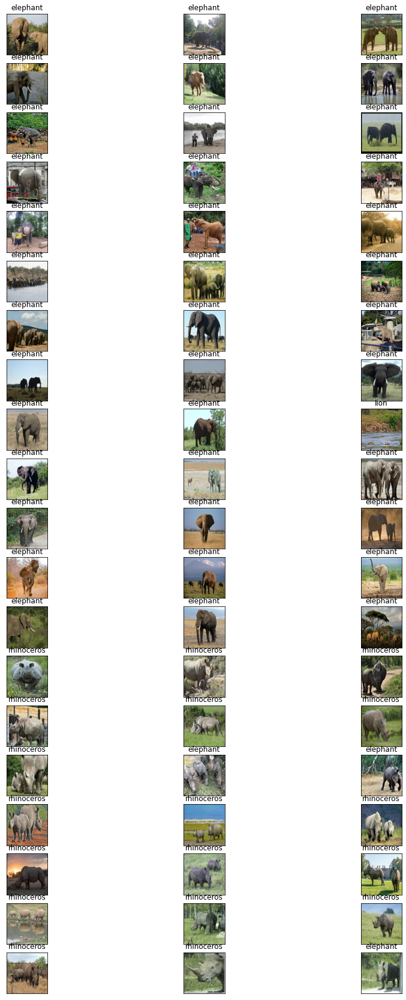

In [77]:
# Check custom image predictions
plt.figure(figsize = (15,30))
for i, image in enumerate(test_images[:60]):
  plt.subplot(20,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(preds_labels[i])
  plt.imshow(image)